In [1]:
"""
Author       : Aditya Jain
Date Started : November 6, 2022
About        : This is the file for testing faster localization models, like YOLO
"""

'\nAuthor       : Aditya Jain\nDate Started : November 6, 2022\nAbout        : This is the file for testing faster localization models, like YOLO\n'

In [2]:
import torchvision.models as torchmodels
import torchvision
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor
import torch
from torch.utils.data import random_split
from torch import nn
from torchsummary import summary
import json
import os
import numpy as np
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms, utils
import torch.nn.functional as F
import torch.optim as optim
import datetime
import time

from localizedataset import LocalizeDataset

/home/mila/a/aditya.jain/.conda/envs/milamoth_ai/lib/python3.9/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


#### Visualize pre-trained inference on trap images

Using cache found in /home/mila/a/aditya.jain/.cache/torch/hub/ultralytics_yolov5_master
YOLOv5 🚀 2022-9-24 Python-3.9.13 torch-1.13.0 CPU

Fusing layers... 
YOLOv5s summary: 213 layers, 7225885 parameters, 0 gradients
Adding AutoShape... 


          xmin         ymin         xmax         ymax  confidence  class  \
0  1174.197998   344.307739  1216.333984   466.124023    0.612418      0   
1   400.351990   992.078308   745.234497  1171.609985    0.545453     25   
2  3708.396484  1020.389526  3763.796387  1119.289551    0.533364     33   
3   480.951813   190.644089   650.034546   438.128418    0.525796      0   
4  3348.970215  1438.010132  3449.538330  1598.515869    0.416903     33   
5   510.071625  1646.256836   595.687744  1768.662354    0.402982      0   
6  1519.924072     0.000000  1562.311768    51.919170    0.352580      0   
7  2820.615967  1557.485718  2991.204346  1696.825195    0.283570     33   

       name  
0    person  
1  umbrella  
2      kite  
3    person  
4      kite  
5    person  
6    person  
7      kite  


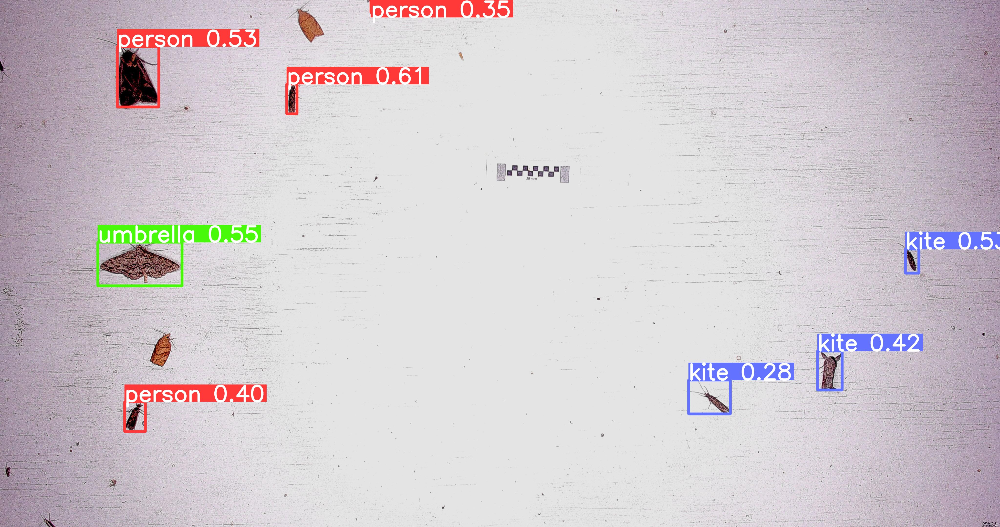

In [3]:
# Model Loading
model = torch.hub.load('ultralytics/yolov5', 'yolov5s')

# # Just specify image path
image_path = 'raw2.jpg'
output     = model(image_path)
print(output.pandas().xyxy[0])
output.show()
# output.save()

#### Training YOLO model

In [5]:
root_dir    = '/home/mila/a/aditya.jain/scratch/Localization/'
BATCH_SIZE  = 32
TRAIN_PER   = 0.85   # percentage of training points in the data
NUM_EPOCHS  = 1
EARLY_STOP  = 4
DTSTR       = datetime.datetime.now()
DTSTR       = DTSTR.strftime("%Y-%m-%d-%H-%M")
SAVE_PATH   = '/home/mila/a/aditya.jain/logs/v2_localization_model_yolov5_' + DTSTR + '.pt'

#### Loading Data

In [6]:
def collate_fn(batch):
    return tuple(zip(*batch))

In [7]:
transform   = transforms.Compose([              
                        transforms.ToTensor()])
data        = LocalizeDataset(root_dir, transform)
train_size  = int(TRAIN_PER*len(data))
val_size    = len(data)-train_size

train_set, val_set = random_split(data, [train_size, val_size])
train_dataloader   = DataLoader(train_set,batch_size=BATCH_SIZE, shuffle=True, collate_fn=collate_fn)
val_dataloader     = DataLoader(val_set,batch_size=BATCH_SIZE, shuffle=True, collate_fn=collate_fn)

#### Loading Model

In [8]:
# autoshape needs to be False for training option

model = torch.hub.load('ultralytics/yolov5', 'yolov5s', classes=2, autoshape=False)
device = "cuda" if torch.cuda.is_available() else "cpu"
print(device)

Using cache found in /home/mila/a/aditya.jain/.cache/torch/hub/ultralytics_yolov5_master
YOLOv5 🚀 2022-9-24 Python-3.9.13 torch-1.13.0 CUDA:0 (Quadro RTX 8000, 48601MiB)

Overriding model.yaml nc=80 with nc=2

                 from  n    params  module                                  arguments                     
  0                -1  1      3520  models.common.Conv                      [3, 32, 6, 2, 2]              
  1                -1  1     18560  models.common.Conv                      [32, 64, 3, 2]                
  2                -1  1     18816  models.common.C3                        [64, 64, 1]                   
  3                -1  1     73984  models.common.Conv                      [64, 128, 3, 2]               
  4                -1  2    115712  models.common.C3                        [128, 128, 2]                 
  5                -1  1    295424  models.common.Conv                      [128, 256, 3, 2]              
  6                -1  3    625152  model

cuda


#### Loading Optimizer

In [9]:
optimizer = torch.optim.SGD(model.parameters(), lr=0.001, momentum=0.9)

#### Model Training

In [10]:
model.train()
lowest_val_loss = 100000000
early_stp_count = 0

for epoch in range(1):
    train_loss = 0
    val_loss   = 0
    
    for image_batch, label_batch in train_dataloader:        
        output       = model(image_batch, label_batch)   
        total_loss   = sum(loss for loss in output.values())
        train_loss   += total_loss.item()
        
        optimizer.zero_grad()
        total_loss.backward()
        optimizer.step()
          
    for image_batch, label_batch in val_dataloader:        
        output       = model(image_batch,label_batch)   
        total_loss   = sum(loss for loss in output.values())
        val_loss     += total_loss.item()        
        
    if val_loss<lowest_val_loss:
        torch.save({
            'epoch': epoch,
            'model_state_dict': model.state_dict(),
            'optimizer_state_dict': optimizer.state_dict(),
            'train_loss': train_loss,
            'val_loss':val_loss}, 
            SAVE_PATH)                
        lowest_val_loss = val_loss
        early_stp_count = 0
    else:
        early_stp_count += 1 
        
    experiment.log_metric("loss_training", train_loss, epoch=epoch)
    experiment.log_metric("loss_validation", val_loss, epoch=epoch)
    
    if early_stp_count >= EARLY_STOP:
        break         


TypeError: conv2d() received an invalid combination of arguments - got (tuple, Parameter, NoneType, tuple, tuple, tuple, int), but expected one of:
 * (Tensor input, Tensor weight, Tensor bias, tuple of ints stride, tuple of ints padding, tuple of ints dilation, int groups)
      didn't match because some of the arguments have invalid types: (!tuple!, !Parameter!, !NoneType!, !tuple!, !tuple!, !tuple!, int)
 * (Tensor input, Tensor weight, Tensor bias, tuple of ints stride, str padding, tuple of ints dilation, int groups)
      didn't match because some of the arguments have invalid types: (!tuple!, !Parameter!, !NoneType!, !tuple!, !tuple!, !tuple!, int)
